In [1]:
import os
os.system("pip install fredapi > NUL 2>&1")

0

In [2]:
!pip install fredapi

Defaulting to user installation because normal site-packages is not writeable


In [3]:
from fredapi import Fred
print("fredapi installed successfully!")

fredapi installed successfully!


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px

plt.style.use('fivethirtyeight')
pd.set_option('display.max_columns', 500)
color_pal = plt.rcParams["axes.prop_cycle"].by_key()["color"]

from fredapi import Fred
fred_key = 'fccb8127e95ff9f5668d94b996d8ab35'

# Objective:

To analyze key U.S. economic indicators using real-time data from the Federal Reserve Economic Data (FRED) API, including:

 - National and state-level unemployment rates

 - S&P 500 index trends

 - Labor force participation rates by state

# 1. Create the Fred Object

In [5]:
fred = Fred(api_key=fred_key)

# 2. Search For Economic Data !

In [6]:
sp_search = fred.search('S&P', order_by='popularity')

In [7]:
sp_search

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
BAMLH0A0HYM2,BAMLH0A0HYM2,2025-02-20,2025-02-20,ICE BofA US High Yield Index Option-Adjusted S...,1996-12-31,2025-02-19,"Daily, Close",D,Percent,%,Not Seasonally Adjusted,NSA,2025-02-20 08:51:08-06:00,92,The ICE BofA Option-Adjusted Spreads (OASs) ar...
CSUSHPINSA,CSUSHPINSA,2025-02-20,2025-02-20,S&P CoreLogic Case-Shiller U.S. National Home ...,1987-01-01,2024-11-01,Monthly,M,Index Jan 2000=100,Index Jan 2000=100,Not Seasonally Adjusted,NSA,2025-01-28 08:12:01-06:00,88,"For more information regarding the index, plea..."
SP500,SP500,2025-02-20,2025-02-20,S&P 500,2015-02-20,2025-02-19,"Daily, Close",D,Index,Index,Not Seasonally Adjusted,NSA,2025-02-19 19:11:52-06:00,83,The observations for the S&P 500 represent the...
BAMLH0A0HYM2EY,BAMLH0A0HYM2EY,2025-02-20,2025-02-20,ICE BofA US High Yield Index Effective Yield,1996-12-31,2025-02-19,"Daily, Close",D,Percent,%,Not Seasonally Adjusted,NSA,2025-02-20 08:51:11-06:00,82,This data represents the effective yield of th...
BAMLC0A0CM,BAMLC0A0CM,2025-02-20,2025-02-20,ICE BofA US Corporate Index Option-Adjusted Sp...,1996-12-31,2025-02-19,"Daily, Close",D,Percent,%,Not Seasonally Adjusted,NSA,2025-02-20 08:59:02-06:00,78,The ICE BofA Option-Adjusted Spreads (OASs) ar...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DDDI12SMA156NWDB,DDDI12SMA156NWDB,2025-02-20,2025-02-20,Private Credit by Deposit Money Banks and Othe...,2001-01-01,2020-01-01,Annual,A,Percent,%,Not Seasonally Adjusted,NSA,2024-05-07 15:28:48-05:00,3,Private credit by deposit money banks and othe...
Q03069USQ605NNBR,Q03069USQ605NNBR,2025-02-20,2025-02-20,"Revenue Freight Tons Originated, Less Than Car...",1920-01-01,1943-07-01,Quarterly,Q,Thousands of Tons,Thous. Of Tons,Not Seasonally Adjusted,NSA,2012-08-16 14:05:10-05:00,3,"Source: Interstate Commerce Commission, Data F..."
CSHICPCZA156NRUG,CSHICPCZA156NRUG,2025-02-20,2025-02-20,Share of Gross Capital Formation at Current Pu...,1990-01-01,2019-01-01,Annual,A,Percent,%,Not Seasonally Adjusted,NSA,2021-11-08 13:36:33-06:00,3,Source ID: csh_i When using these data in you...


# 3. Pull Raw Data and Plot !

<Axes: title={'center': 'S&P 500'}>

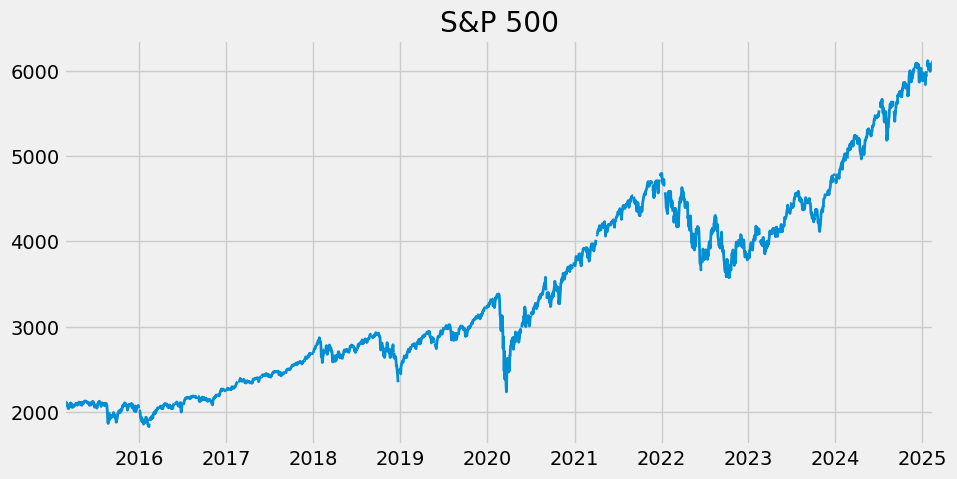

In [8]:
sp500 = fred.get_series(series_id = 'SP500')
sp500.plot(figsize=(10,5), title = 'S&P 500', lw=2)

# 4. Pull and Join Multiple Data Series !

<Axes: >

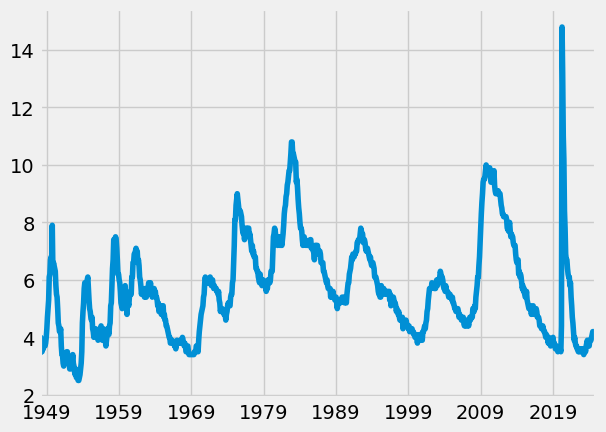

In [9]:
unemployment = fred.search('unemployment')
unrate = fred.get_series('UNRATE')
unrate.plot()

In [10]:
unemployment_df = fred.search('unemployment state', filter=('frequency', 'Monthly'))
unemployment_df = unemployment_df.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent"')
unemployment_df = unemployment_df.loc[unemployment_df['title'].str.contains('Unemployment Rate')]

In [11]:
all_result = []

# Filter unemployment_df to keep only state-level unemployment series
state_unemployment_df = unemployment_df[unemployment_df.index.str.match(r'^[A-Z]{2}UR$')]

for myid in state_unemployment_df.index:  # Loop through filtered state series
    results = fred.get_series(myid)  # Fetch time series data
    results = results.to_frame(name=myid)  # Convert to DataFrame and name the column
    all_result.append(results)  # Append the DataFrame

# Combine all state unemployment data into one DataFrame
unemployment_states = pd.concat(all_result, axis=1)
id_to_state= state_unemployment_df['title'].str.replace('Unemployment Rate in', '').to_dict()
unemployment_states.columns = [id_to_state[c] for c in unemployment_states.columns]

In [12]:
px.line(unemployment_states)

# 5. Pull April 2024 & 2023 Unemployment Rate per State

<Axes: title={'center': '2024 Unemployment Rate by States'}>

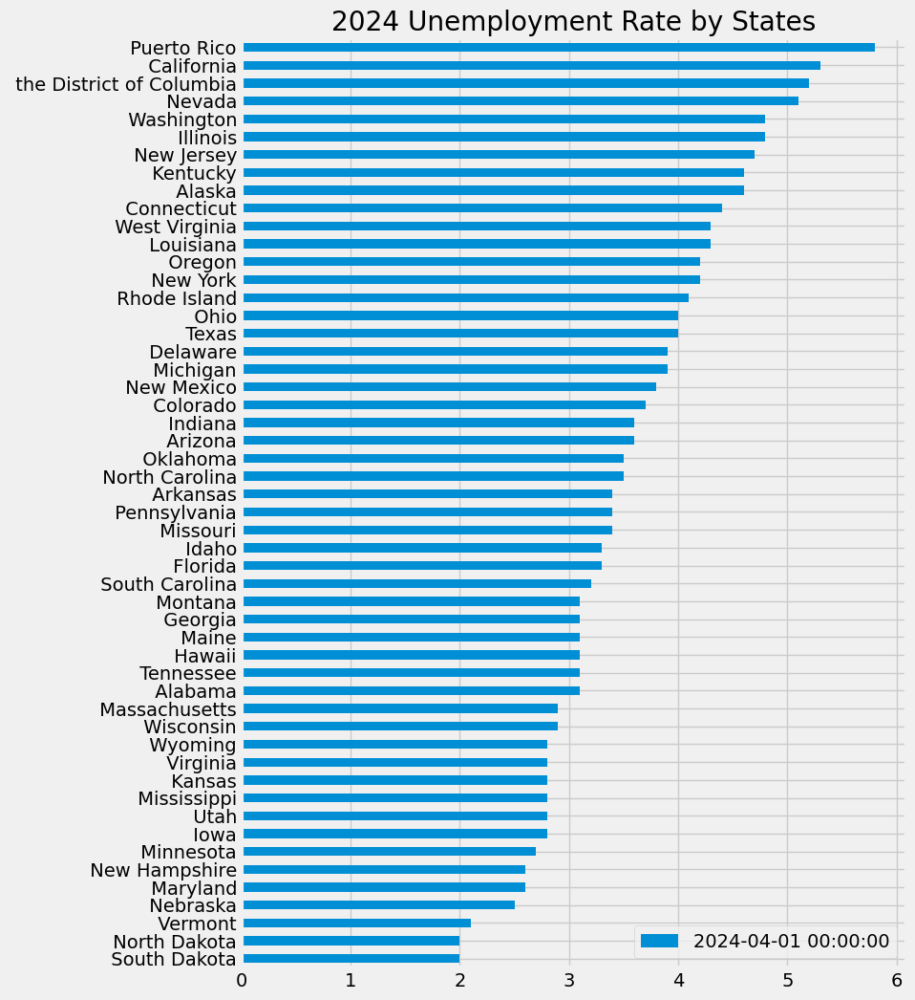

In [13]:
unemployment_states.loc[unemployment_states.index == '2024-04-01'].T.sort_values('2024-04-01').plot(kind='barh', figsize=(8,12), title = '2024 Unemployment Rate by States')


<Axes: title={'center': '2023 Unemployment Rate by States'}>

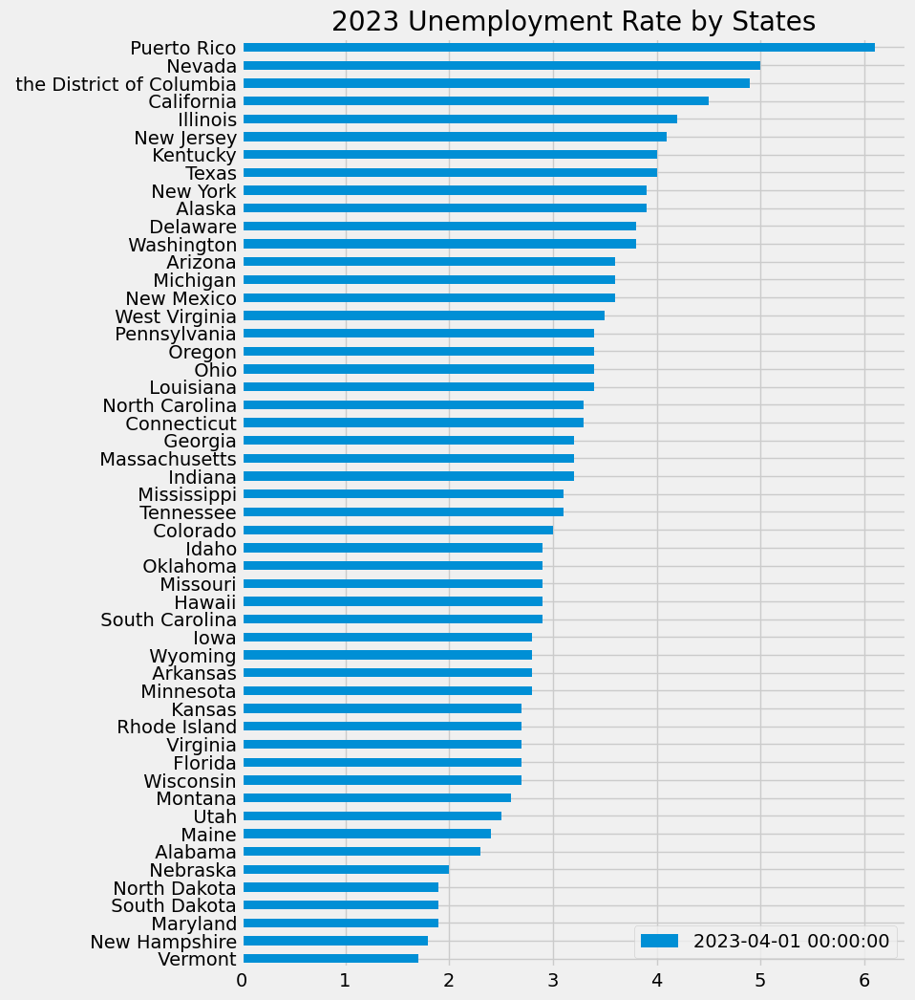

In [14]:
unemployment_states.loc[unemployment_states.index == '2023-04-01'].T.sort_values('2023-04-01').plot(kind='barh', figsize=(8,12), title = '2023 Unemployment Rate by States')


## State-Level Unemployment Rate (2023 vs 2024)

A clear regional disparity:

 - States like Nevada and California have higher unemployment.

 - States like North Dakota, South Dakota, and Nebraska remain consistently low.

Comparing April 2023 to April 2024 shows some improvement in specific states (Arizona, Minnesota).

# 6. Pull Participation Rate

In [15]:
part_df = fred.search('labour participation rate state', filter=('frequency', 'Monthly'))
part_df = part_df.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent"')

In [16]:
part_df

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
CIVPART,CIVPART,2025-02-20,2025-02-20,Labor Force Participation Rate,1948-01-01,2025-01-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2025-02-07 07:48:54-06:00,84,The series comes from the 'Current Population ...
LNS11300060,LNS11300060,2025-02-20,2025-02-20,Labor Force Participation Rate - 25-54 Yrs.,1948-01-01,2025-01-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2025-02-07 07:48:51-06:00,70,The series comes from the 'Current Population ...
LNS11300002,LNS11300002,2025-02-20,2025-02-20,Labor Force Participation Rate - Women,1948-01-01,2025-01-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2025-02-07 07:49:10-06:00,66,To obtain estimates of women worker employment...
LNS11300001,LNS11300001,2025-02-20,2025-02-20,Labor Force Participation Rate - Men,1948-01-01,2025-01-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2025-02-07 07:49:10-06:00,61,The series comes from the 'Current Population ...
LNS11324230,LNS11324230,2025-02-20,2025-02-20,Labor Force Participation Rate - 55 Yrs. & over,1948-01-01,2025-01-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2025-02-07 07:48:51-06:00,54,The series comes from the 'Current Population ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LRINTTFEUSM156S,LRINTTFEUSM156S,2025-02-20,2025-02-20,Infra-Annual Labor Statistics: Inactivity Rate...,1975-01-01,2025-01-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2025-02-17 13:49:06-06:00,1,OECD Data Filters: REF_AREA: USA MEASURE: OLF...
LRIN74FEUSM156S,LRIN74FEUSM156S,2025-02-20,2025-02-20,Infra-Annual Labor Statistics: Inactivity Rate...,1981-01-01,2025-01-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2025-02-17 13:49:08-06:00,1,OECD Data Filters: REF_AREA: USA MEASURE: OLF...
LRIN74MAUSM156S,LRIN74MAUSM156S,2025-02-20,2025-02-20,Infra-Annual Labor Statistics: Inactivity Rate...,1981-01-01,2025-01-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2025-02-17 13:49:07-06:00,1,OECD Data Filters: REF_AREA: USA MEASURE: OLF...


In [17]:
part_df = fred.search('participation rate state', filter=('frequency','Monthly'))
part_df = part_df.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent"')

part_id_to_state = part_df['title'].str.replace('Labor Force Participation Rate for ','').to_dict()

all_results = []

for myid in part_df.index:
    results = fred.get_series(myid)  # Fetch time series data
    results = results.to_frame(name=myid)  # Convert to DataFrame and name the column
    all_results.append(results)  # Append the DataFrame

# Step 4: Concatenate all the results into one DataFrame
part_states = pd.concat(all_results, axis=1)

# Step 5: Rename the columns with the state names using the dictionary
part_states.columns = [part_id_to_state[c] for c in part_states.columns]

# Step 6: Define the list of full state names (you can use the US state abbreviations or a list of full names)
us_state_names = [
    'Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California', 'Colorado', 'Connecticut', 'Delaware', 
    'Florida', 'Georgia', 'Hawaii', 'Idaho', 'Illinois', 'Indiana', 'Iowa', 'Kansas', 'Kentucky', 
    'Louisiana', 'Maine', 'Maryland', 'Massachusetts', 'Michigan', 'Minnesota', 'Mississippi', 'Missouri',
    'Montana', 'Nebraska', 'Nevada', 'New Hampshire', 'New Jersey', 'New Mexico', 'New York', 'North Carolina',
    'North Dakota', 'Ohio', 'Oklahoma', 'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 'South Dakota',
    'Tennessee', 'Texas', 'Utah', 'Vermont', 'Virginia', 'Washington', 'West Virginia', 'Wisconsin', 'Wyoming'
]

# Step 7: Filter the columns to keep only those that are full state names
state_columns = [col for col in part_states.columns if col in us_state_names]

# Step 8: Keep only the state-level columns
part_states_filtered = part_states[state_columns]

part_states_filtered



,California,Alabama,New York,Michigan,Mississippi,Texas,Florida,Kentucky,Ohio,Wisconsin,Pennsylvania,Massachusetts,Minnesota,Maryland,West Virginia,Tennessee,Maine,Illinois,North Carolina,Georgia,Louisiana,South Carolina,Colorado,Utah,Virginia,Indiana,Missouri,New Jersey,Iowa,Alaska,Washington,Arizona,New Mexico,Idaho,Arkansas,Oklahoma,Nebraska,Hawaii,Nevada,Montana,Oregon,New Hampshire,Vermont,Connecticut,North Dakota,South Dakota,Kansas,Rhode Island,Delaware,Wyoming
1948-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1948-02-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1948-03-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1948-04-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1948-05-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-09-01,62.1,57.5,61.2,62.3,54.5,64.5,58.5,57.9,62.4,65.6,62.4,66.4,67.7,65.5,55.1,59.4,60.1,65.0,60.2,61.8,58.6,57.6,67.9,68.4,66.0,63.0,63.9,64.7,66.3,64.9,63.3,62.2,57.5,63.2,58.1,63.1,68.3,59.6,62.7,62.9,63.0,65.7,65.7,64.1,68.8,67.5,66.2,65.1,59.5,63.2
2024-10-01,62.1,57.6,61.2,62.2,54.7,64.6,58.3,58.1,62.5,65.7,62.2,66.4,67.7,65.6,55.0,59.4,60.2,65.1,60.1,61.7,58.5,57.6,67.9,68.3,66.0,63.2,63.9,64.6,66.2,64.9,63.2,62.1,57.6,63.3,58.1,63.0,68.4,59.7,62.7,62.9,63.0,65.7,65.6,64.1,68.8,67.6,66.4,65.0,59.3,63.2
2024-11-01,62.1,57.6,61.2,62.2,55.0,64.7,58.2,58.2,62.6,65.8,61.9,66.4,67.8,65.6,54.9,59.4,60.1,65.2,60.0,61.6,58.4,57.6,67.9,68.2,66.0,63.4,63.9,64.5,66.3,65.0,63.0,61.9,57.6,63.4,58.2,62.9,68.5,59.8,62.6,62.7,63.0,65.7,65.5,64.1,68.9,67.6,66.5,64.8,59.2,63.2
2024-12-01,62.1,57.7,61.2,62.2,55.3,64.7,58.0,58.3,62.6,65.9,61.8,66.5,67.8,65.6,54.8,59.4,60.2,65.2,59.9,61.5,58.4,57.5,67.9,68.2,66.0,63.5,63.9,64.4,66.4,64.9,63.0,61.7,57.7,63.6,58.2,62.8,68.5,59.9,62.6,62.6,63.0,65.8,65.5,64.4,69.0,67.7,66.7,64.6,59.0,63.2


# 7. Plot Unemployment vs Participation for each state!

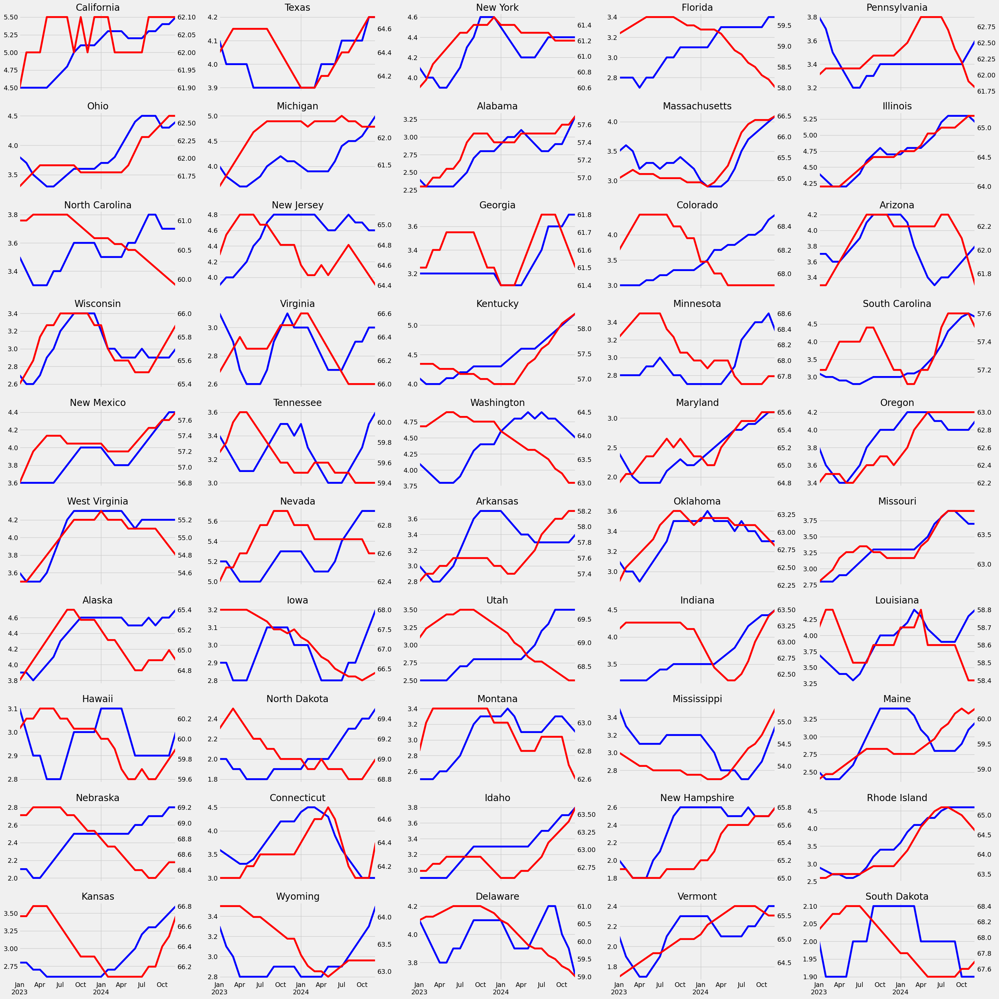

In [18]:
# Remove leading/trailing spaces from unemployment_states column names
unemployment_states.columns = unemployment_states.columns.str.strip()

# Fix DC
unemployment_states = unemployment_states.rename(columns={'the District of Columbia':'District Of Columbia'})

# Create a list of colors for the plots
color_pal = ['blue', 'red']

# Create the figure and axis grid
fig, axs = plt.subplots(10, 5, figsize=(30, 30), sharex=True)
axs = axs.flatten()

# Plot each state in a grid
i = 0
for state in unemployment_states.columns:
    if state in ["District Of Columbia", "Puerto Rico"]:
        continue
    ax2 = axs[i].twinx()  # Create the second axis for each plot
    unemployment_states.query('index >= "2023-01-01" and index < "2025-01-01"')[state] \
        .plot(ax=axs[i], label='Unemployment Rate', color=color_pal[0])  # Unemployment rate on the first axis
    part_states_filtered.query('index >= "2023-01-01" and index < "2025-01-01"')[state] \
        .plot(ax=ax2, label='Labor Force Participation', color=color_pal[1])  # Participation rate on the second axis
    ax2.grid(False)  # Disable grid on the second axis
    axs[i].set_title(state)  # Set the title for each subplot
    i += 1

# Adjust layout to avoid overlap
plt.tight_layout()
plt.show()


## 🔍 Key Takeaways: State Labor Trends (2023–2025)

- **California & New York**: Rising unemployment with flat or falling participation → Possible job market stress or disengagement.
- **Texas & Illinois**: Participation increasing → Labor market expansion or new job seekers entering.
- **Florida**: Low unemployment + steady participation → Strong and stable job market.
- **Nevada**: High unemployment + stagnant participation → Ongoing recovery challenges.
- **North & South Dakota**: Low unemployment + high participation → Robust state economies.
- **West Virginia & Mississippi**: Low participation → Structural or demographic workforce issues.
- **Washington & Oregon**: Unemployment rising, participation flat → Early signs of labor market softening.


## ✅ Suggestions Based on State Labor Trends (2023–2025)

 These findings can support data-driven decisions in regional workforce development, economic stimulus targeting, or private sector talent strategy.
- **California & New York**: Invest in re-skilling programs and job matching services to address rising unemployment and potential workforce disengagement.
- **Texas & Illinois**: Support infrastructure and business growth to absorb the expanding labor force and sustain momentum.
- **Florida**: Maintain current economic policies; consider replicating its workforce stability strategies in other states.
- **Nevada**: Focus on diversifying the economy beyond tourism and expanding job training in growing sectors like tech or logistics.
- **North & South Dakota**: Use these states as case studies for successful employment and participation models.

# 8. Fetch & Visualize State-Level Inflation vs. Unemployment

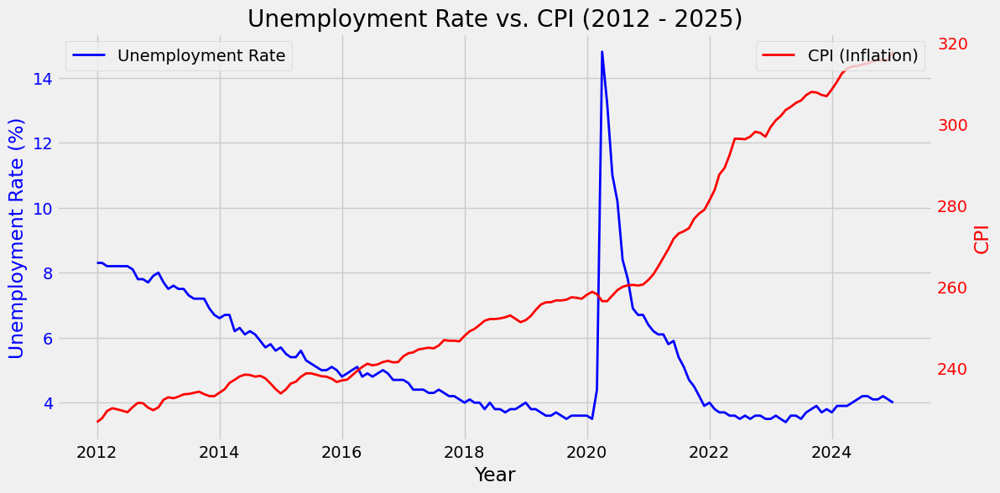

In [34]:
# Fetch CPI Data
cpi_data = fred.get_series('CPIAUCNS')  # Consumer Price Index for All Urban Consumers (CPI-U)
cpi_data = cpi_data.to_frame(name="CPI")
cpi_data.index = pd.to_datetime(cpi_data.index)

# Fetch Unemployment Data
unrate.index = pd.to_datetime(unrate.index)

# Filter data between 2012 and 2025
cpi_data = cpi_data.loc["2012-01-01":"2025-01-01"]
unrate = unrate.loc["2012-01-01":"2025-01-01"]

# Plot CPI vs. Unemployment (Dual-Axis)
fig, ax1 = plt.subplots(figsize=(12, 6))

# Unemployment Rate Plot
ax1.plot(unrate.index, unrate, color='blue', label="Unemployment Rate", lw=2)
ax1.set_ylabel("Unemployment Rate (%)", color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Create second y-axis for CPI
ax2 = ax1.twinx()
ax2.plot(cpi_data.index, cpi_data, color='red', label="CPI (Inflation)", lw=2)
ax2.set_ylabel("CPI", color='red')
ax2.tick_params(axis='y', labelcolor='red')
ax2.grid(False)

# Titles and Legends
ax1.set_xlabel("Year")
ax1.set_title("Unemployment Rate vs. CPI (2012 - 2025)")
ax1.legend(loc="upper left")
ax2.legend(loc="upper right")

plt.show()

## 📈 Unemployment Rate vs. CPI (2012–2025)

### 🔍 Key Findings:
- **2012–2019**: Unemployment declined steadily while CPI rose gradually — indicating stable growth.
- **2020 spike**: COVID-19 caused a sharp rise in unemployment with only a mild CPI dip.
- **2021–2023**: As unemployment fell, CPI (inflation) surged — showing classic post-pandemic inflation pressure.
- **2024–2025**: Unemployment stabilized at low levels; CPI continued climbing, though more moderately.

### ✅ Suggestions:
- **Monitor inflation impact**: Continued CPI growth could erode purchasing power — relevant for wage policy or interest rate strategy.
- **Policy insight**: A strong job market with rising inflation may support tighter monetary policy.
- **Further analysis**: Explore lag correlation between CPI and unemployment (Phillips Curve dynamics).


In [33]:
cpi_data

,CPI
2012-01-01,226.665
2012-02-01,227.663
2012-03-01,229.392
2012-04-01,230.085
2012-05-01,229.815
...,...
2024-09-01,315.301
2024-10-01,315.664
2024-11-01,315.493
2024-12-01,315.605
